<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Project-Scope" data-toc-modified-id="Project-Scope-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Project Scope</a></span></li><li><span><a href="#Step1:-Computing-correlations" data-toc-modified-id="Step1:-Computing-correlations-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Step1: Computing correlations</a></span></li><li><span><a href="#Step2:-Setting-the-context" data-toc-modified-id="Step2:-Setting-the-context-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Step2: Setting the context</a></span></li><li><span><a href="#Step3:-District-level-mapping" data-toc-modified-id="Step3:-District-level-mapping-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Step3: District level mapping</a></span></li><li><span><a href="#Step4:-Exploring-enrollment-and-SAT-scores" data-toc-modified-id="Step4:-Exploring-enrollment-and-SAT-scores-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Step4: Exploring enrollment and SAT scores</a></span></li><li><span><a href="#Step5:-Exploring-English-language-learners-and-SAT-scores" data-toc-modified-id="Step5:-Exploring-English-language-learners-and-SAT-scores-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Step5: Exploring English language learners and SAT scores</a></span></li><li><span><a href="#Step6:-Correlating-survey-scores-and-SAT-scores" data-toc-modified-id="Step6:-Correlating-survey-scores-and-SAT-scores-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Step6: Correlating survey scores and SAT scores</a></span></li><li><span><a href="#Step7:-Exploring-race-and-SAT-scores" data-toc-modified-id="Step7:-Exploring-race-and-SAT-scores-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Step7: Exploring race and SAT scores</a></span></li><li><span><a href="#Step8:-Gender-differences-in-SAT-scores" data-toc-modified-id="Step8:-Gender-differences-in-SAT-scores-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Step8: Gender differences in SAT scores</a></span></li><li><span><a href="#Step9:-AP-score" data-toc-modified-id="Step9:-AP-score-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>Step9: AP score</a></span></li></ul></div>

## Project Scope

In this project, I went over a basic Python data analysis pipeline from start to finish.
In the second part of this notebook, I analyzed factors that correlated with the SAT scores, and did some exploratory visualization and analysis.

## Step1: Computing correlations
To explore a dataset and see what columns are related to the one cared about (SAT score in this case) is to compute correlations. This will tell which columns are closely related to the SAT score. We can do this via the corr method on Pandas DataFrames. The closer to 0 the correlation, the weaker the connection. The closer to 1, the stronger the positive correlation, and the closer to -1, the stronger the negative correlation:

In [1]:
import pandas as pd

full=pd.read_csv('full.csv')
full.corr()['sat_score']

Unnamed: 0                          -0.025372
Grade                                     NaN
Year                                      NaN
Number Tested                        0.055520
Mean Scale Score                     0.676679
Level 1 #                           -0.509504
Level 1 %                           -0.574281
Level 2 #                           -0.390404
Level 2 %                           -0.656644
Level 3 #                            0.382374
Level 3 %                            0.427424
Level 4 #                            0.628875
Level 4 %                            0.616284
Level 3+4 #                          0.545082
Level 3+4 %                          0.674423
SAT Critical Reading Avg. Score      0.987692
SAT Math Avg. Score                  0.972780
SAT Writing Avg. Score               0.987845
sat_score                            1.000000
schoolyear                                NaN
fl_percent                                NaN
frl_percent                       

This gives us quite a few insights that we'll need to explore:
* Total enrollment correlates strongly with sat_score, which is surprising, because you'd think smaller schools, which focused more on the student, would have higher scores.
* The percentage of females at a school (female_per) correlates positively with SAT score, whereas the percentage of males (male_per) correlates negatively.
* None of the survey responses correlate highly with SAT scores.
* There is a significant racial inequality in SAT scores (white_per, asian_per, black_per, hispanic_per).
* ell_percent correlates strongly negatively with SAT scores.
* Each of these items is a potential angle to explore and tell a story about using the data.

## Step2: Setting the context
Before we dive into exploring the data, we'll want to set the context, both for ourselves, and anyone else that reads our analysis. One good way to do this is with exploratory charts or maps. In this case, we'll map out the positions of the schools, which will help readers understand the problem we're exploring.
In the below code, we:
* Setup a map centered on New York City.
+ Add a marker to the map for each high school in the city.
* Display the map.

In [2]:
import folium
from folium import plugins
import pandas as pd

full=pd.read_csv('full.csv')

schools_map = folium.Map(location=[full['lat'].mean(), full['lon'].mean()], zoom_start=10)
marker_cluster = folium.plugins.MarkerCluster().add_to(schools_map)
for name, row in full.iterrows():
    folium.Marker(location = [row["lat"], row["lon"]], popup="{0}: {1}").add_to(marker_cluster)
    
schools_map.save("schools.html")
schools_map

C:\Users\User\Anaconda2\lib\site-packages\folium\__init__.py:59: UserWarning: This version of folium is the last to support Python 2. Transition to Python 3 to be able to receive updates and fixes. Check out https://python3statement.org/ for more info.
  UserWarning


This map is helpful, but it's hard to see where the most schools are in NYC. Instead, we'll make a heatmap:

In [3]:
schools_heatmap = folium.Map(location=[full['lat'].mean(), full['lon'].mean()], zoom_start=10)
schools_heatmap.add_child(plugins.HeatMap([[row["lat"], row["lon"]] for name, row in full.iterrows()]))
schools_heatmap.save("heatmap.html")
schools_heatmap

## Step3: District level mapping
Heatmaps are good for mapping out gradients, but we'll want something with more structure to plot out differences in SAT score across the city. School districts are a good way to visualize this information, as each district has its own administration. New York City has several dozen school districts, and each district is a small geographic area.
We can compute SAT score by school district, then plot this out on a map. In the below code, we'll:
* Group full by school district.
* Compute the average of each column for each school district.
* Convert the school_dist field to remove leading 0s, so we can match our geograpghic district data.

In [4]:
import numpy as np

district_data = full.groupby("school_dist").agg(np.mean)
district_data.reset_index(inplace=True)
district_data["school_dist"] = district_data["school_dist"].apply(lambda x: str(int(x)))
district_data

,school_dist,Unnamed: 0,Grade,Year,Number Tested,Mean Scale Score,Level 1 #,Level 1 %,Level 2 #,Level 2 %,...,com_tot_11,eng_tot_11,aca_tot_11,CSD,NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,SCHOOLWIDE PUPIL-TEACHER RATIO
0,1,129.857143,8.0,2011.0,67.501931,661.500000,8.500000,17.100000,24.500000,47.300000,...,6.842857,7.200000,7.728571,1.0,117.511870,5.202949,22.704137,18.365008,26.843786,NaN
1,2,137.019608,8.0,2011.0,72.028087,674.000000,3.000000,9.400000,10.500000,33.200000,...,6.674510,6.990196,7.490196,2.0,164.399306,6.279080,25.113515,20.289521,29.108830,NaN
2,3,137.785714,8.0,2011.0,68.030888,686.000000,6.000000,10.900000,16.000000,29.100000,...,6.628571,6.935714,7.435714,3.0,146.892356,5.625330,22.818868,18.948012,26.120322,NaN
3,4,76.428571,8.0,2011.0,67.544402,679.666667,2.666667,3.266667,27.333333,40.833333,...,7.271429,7.500000,8.071429,4.0,129.413285,4.978325,24.787783,21.016327,27.582740,NaN
4,5,126.000000,8.0,2011.0,88.015444,677.750000,6.000000,9.100000,28.000000,33.350000,...,6.657143,6.900000,7.528571,5.0,114.864286,4.612271,24.049038,20.055357,27.602473,NaN
5,6,98.700000,8.0,2011.0,76.791892,672.333333,8.666667,10.033333,29.666667,34.900000,...,6.920000,7.170000,7.760000,6.0,139.041709,5.285860,25.324199,20.556126,29.217872,NaN
6,7,124.066667,8.0,2011.0,79.715315,668.250000,10.250000,11.725000,40.500000,45.400000,...,6.733333,7.013333,7.560000,7.0,96.776584,4.064317,23.927326,19.879125,27.230962,NaN
7,8,192.500000,8.0,2011.0,72.102317,667.000000,5.500000,8.800000,28.000000,47.700000,...,6.450000,6.685714,7.235714,8.0,130.245547,5.258212,23.330603,18.631070,27.202677,NaN
8,9,137.136364,8.0,2011.0,71.024570,669.857143,5.714286,9.385714,25.714286,41.628571,...,6.809091,7.090909,7.654545,9.0,122.537425,5.015612,24.334560,19.949618,28.586596,NaN
9,10,169.652174,8.0,2011.0,85.854289,668.400000,11.200000,10.120000,57.800000,47.720000,...,6.569565,6.904348,7.452174,10.0,170.895481,6.593661,24.285629,18.880024,28.639997,NaN


Store the district_data in csv format.

In [5]:
district_data.to_csv('district_data.csv')

We'll now we able to plot the average SAT score in each school district. In order to do this, we'll read in data in GeoJSON format to get the shapes of each district, then match each district shape with the SAT score using the school_dist column, then finally create the plot:

In [6]:
import json
import pandas as pd

def show_district_map(col):
    full=pd.read_csv('full.csv')
    district_data=pd.read_csv('district_data.csv')
    geo_data =r'schoolDistricts.json'
    geo_json_data=json.load(open(geo_data))
    #Create a map:
    districts = folium.Map(location=[full['lat'].mean(), full['lon'].mean()], zoom_start=10)
    #Create a layer, shaded by col:
    folium.Choropleth(
        geo_json_data,
        data=district_data,
        columns=['school_dist', col],
        key_on='feature.properties.SchoolDist',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2,
    ).add_to(districts)
    #Output the map to an .html file:
    districts.save(outfile='districts_1.html')
    return districts


## Step4: Exploring enrollment and SAT scores
Now that we've set the context by plotting out where the schools are, and SAT score by district, people viewing our analysis have a better idea of the context behind the dataset. Now that we've set the stage, we can move into exploring the angles we identified earlier, when we were finding correlations. The first angle to explore is the relationship between the number of students enrolled in a school and SAT score.
We can explore this with a scatter plot that compares total enrollment across all schools to SAT scores across all schools.

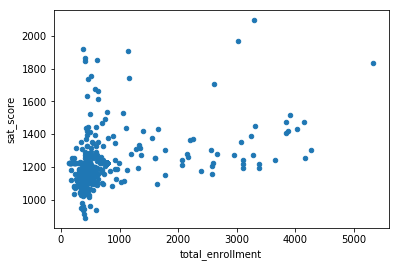

In [7]:
%matplotlib inline

full.plot.scatter(x='total_enrollment', y='sat_score')

As you can see, there's a cluster at the bottom left with low total enrollment and low SAT scores. Other than this cluster, there appears to only be a slight positive correlation between SAT scores and total enrollment. Graphing out correlations can reveal unexpected patterns.
We can explore this further by getting the names of the schools with low enrollment and low SAT scores:

In [8]:
full[(full["total_enrollment"] < 1000) & (full["sat_score"] < 1000)]["School Name"]

32     INTERNATIONAL SCHOOL FOR LIBERAL ARTS
139      INTERNATIONAL COMMUNITY HIGH SCHOOL
165                                      NaN
172    KINGSBRIDGE INTERNATIONAL HIGH SCHOOL
204            HIGH SCHOOL OF WORLD CULTURES
211       BROOKLYN INTERNATIONAL HIGH SCHOOL
235    INTERNATIONAL HIGH SCHOOL AT PROSPECT
243               IT TAKES A VILLAGE ACADEMY
257                MULTICULTURAL HIGH SCHOOL
Name: School Name, dtype: object

Some searching on Google shows that most of these schools are for students who are learning English, and are low enrollment as a result. This exploration showed us that it's not total enrollment that's correlated to SAT score -- it's whether or not students in the school are learning English as a second language or not.

## Step5: Exploring English language learners and SAT scores
Now that we know the percentage of English language learners in a school is correlated with lower SAT scores, we can explore the relationship. The ell_percent column is the percentage of students in each school who are learning English. We can make a scatterplot of this relationship:

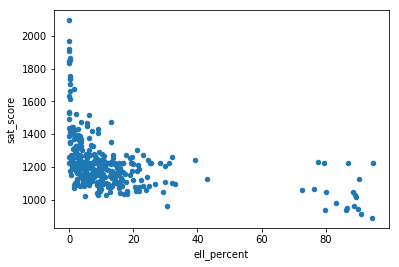

In [9]:
full.plot.scatter(x='ell_percent', y='sat_score')

It looks like there are a group of schools with a high ell_percentage that also have low average SAT scores. We can investigate this at the district level, by figuring out the percentage of English language learners in each district, and seeing it if matches our map of SAT scores by district:

In [10]:
show_district_map("ell_percent")

In [11]:
show_district_map("sat_score")

As we can see by looking at the two district level maps, districts with a low proportion of ELL learners tend to have high SAT scores, and vice versa.

## Step6: Correlating survey scores and SAT scores
It would be fair to assume that the results of student, parent, and teacher surveys would have a large correlation with SAT scores. It makes sense that schools with high academic expectations, for instance, would tend to have higher SAT scores. To test this theory, lets plot out SAT scores and the various survey metrics:

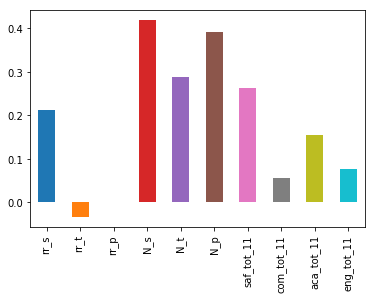

In [12]:
full.corr()["sat_score"][["rr_s", "rr_t", "rr_p", "N_s", "N_t", "N_p", "saf_tot_11", "com_tot_11", "aca_tot_11", "eng_tot_11"]].plot.bar()

Surprisingly, the two factors that correlate the most are N_p and N_s, which are the counts of parents and students who responded to the surveys. Both strongly correlate with total enrollment, so are likely biased by the ell_learners. The other metric that correlates most is saf_t_11. That is how safe students, parents, and teachers perceived the school to be. It makes sense that the safer the school, the more comfortable students feel learning in the environment. However, none of the other factors, like engagement, communication, and academic expectations, correlated with SAT scores. 

## Step7: Exploring race and SAT scores
One of the other angles to investigate involves race and SAT scores. There was a large correlation differential, and plotting it out will help us understand what's happening:

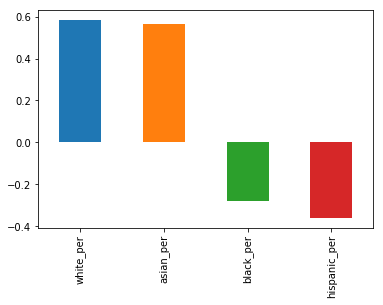

In [13]:
full.corr()["sat_score"][["white_per", "asian_per", "black_per", "hispanic_per"]].plot.bar()

It looks like the higher percentages of white and asian students correlate with higher SAT scores, but higher percentages of black and hispanic students correlate with lower SAT scores. For hispanic students, this may be due to the fact that there are more recent immigrants who are ELL learners. We can map the hispanic percentage by district to eyeball the correlation:

In [14]:
show_district_map("hispanic_per")

In [15]:
show_district_map("ell_percent")

## Step8: Gender differences in SAT scores
The final angle to explore is the relationship between gender and SAT score. We noted that a higher percentage of females in a school tends to correlate with higher SAT scores. We can visualize this with a bar graph:

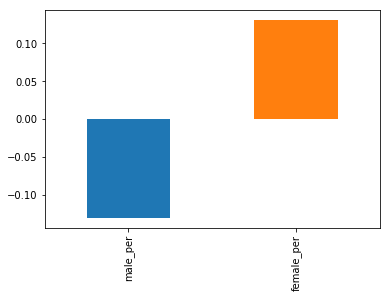

In [16]:
full.corr()["sat_score"][["male_per", "female_per"]].plot.bar()

To dig more into the correlation, we can make a scatterplot of female_per and sat_score:

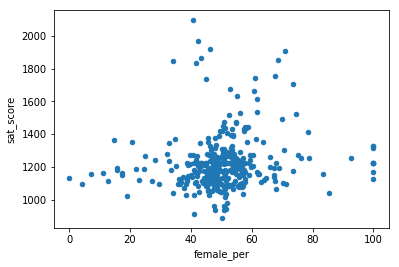

In [17]:
full.plot.scatter(x='female_per', y='sat_score')

It looks like there's a cluster of schools with a high percentage of females, and very high SAT scores (in the top right). We can get the names of the schools in this cluster:

In [18]:
full[(full["female_per"] > 65) & (full["sat_score"] > 1400)]["School Name"]

2             PROFESSIONAL PERFORMING ARTS HIGH SCH
76                   BARD HIGH SCHOOL EARLY COLLEGE
92                    ELEANOR ROOSEVELT HIGH SCHOOL
105                    TALENT UNLIMITED HIGH SCHOOL
123            FIORELLO H. LAGUARDIA HIGH SCHOOL OF
293                     TOWNSEND HARRIS HIGH SCHOOL
324    FRANK SINATRA SCHOOL OF THE ARTS HIGH SCHOOL
Name: School Name, dtype: object

Searching Google reveals that these are elite schools that focus on the performing arts. These schools tend to have higher percentages of females, and higher SAT scores. This likely accounts for the correlation between higher female percentages and SAT scores, and the inverse correlation between higher male percentages and lower SAT scores.

## Step9: AP score
So far, we've looked at demographic angles. One angle that we have the data to look at is the relationship between more students taking Advanced Placement exams and higher SAT scores. It makes sense that they would be correlated, since students who are high academic achievers tend to do better on the SAT.

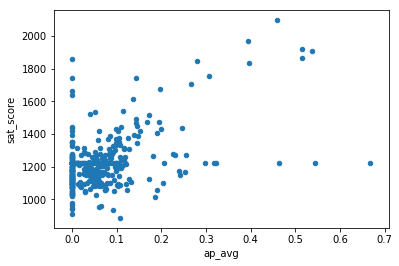

In [19]:
full["ap_avg"] = full["AP Test Takers "] / full["total_enrollment"]

full.plot.scatter(x='ap_avg', y='sat_score')

It looks like there is indeed a strong correlation between the two. An interesting cluster of schools is the one at the top right, which has high SAT scores and a high proportion of students that take the AP exams:

In [20]:
full[(full["ap_avg"] > .3) & (full["sat_score"] > 1700)]["School Name"]

92             ELEANOR ROOSEVELT HIGH SCHOOL
102                   STUYVESANT HIGH SCHOOL
181             BRONX HIGH SCHOOL OF SCIENCE
184    HIGH SCHOOL OF AMERICAN STUDIES AT LE
210           BROOKLYN TECHNICAL HIGH SCHOOL
293              TOWNSEND HARRIS HIGH SCHOOL
313    QUEENS HIGH SCHOOL FOR THE SCIENCES A
Name: School Name, dtype: object

Some Google searching reveals that these are mostly highly selective schools where you need to take a test to get in. It makes sense that these schools would have high proportions of AP test takers.